In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from satellite_list_object import satellite_database
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.image as mpimg
###for the app
from flask import Flask, render_template
from io import BytesIO
import base64

In [7]:
#definining instance of class
dataset = satellite_database(input_mode = "random_generated", number = 100, input_data = pd.DataFrame)

In [8]:
def test_satellite_database(total_time = 200, sat_object = dataset):
    object = sat_object
    object.build_input_data()
    total_df = pd.DataFrame()
    for time in range(1, total_time):
        object.move_by_one_second()
        df = object.return_full_dataframe()
        total_df = pd.concat([total_df, df])
    return total_df
final_df = test_satellite_database()
print(final_df.head())

time_first = final_df.time.min()
time_last = final_df.time.max()


###remove points that go too far out of the dataset
final_df = final_df[final_df['coordinate_x']<10000]
final_df = final_df[final_df['coordinate_y']<10000]
final_df = final_df[final_df['coordinate_z']<10000]



randomly generating input data
creating empty dataframe
          name        description  classtype  coordinate_x  coordinate_y  \
NVF877  NVF877  dummy_description      fixed   5153.472032  -1111.333642   
JNW5XU  JNW5XU  dummy_description  transport  -2348.414379   6163.909979   
DNI232  DNI232  dummy_description  transport  -8062.650083  -2030.893865   
8U1A7J  8U1A7J  dummy_description      fixed   5205.592843   -216.590962   
LETHDS  LETHDS  dummy_description       junk  -1809.539817  -4707.095768   

        coordinate_z  direction_x  direction_y  direction_z  velocity  \
NVF877   4417.461952    -0.091860     0.254105     0.964167  6.903661   
JNW5XU   1430.560197    -0.212767     0.556181    -0.800276  7.054565   
DNI232    203.084344    -0.977322    -0.187039     0.097706  7.139303   
8U1A7J  -6127.862871     0.844967     0.201439    -0.482684  7.339805   
LETHDS   4334.677484     0.104614    -0.230541    -0.965955  7.001661   

           altitude  time  
NVF877   503.524731 

In [9]:
###image load for globe
img = mpimg.imread('sc_sample_globe_image.jpg')

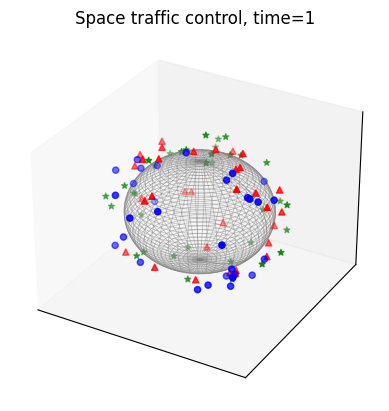

In [10]:
from IPython.display import HTML
app = Flask(__name__)
@app.route("/")
def update_graph(num):
    ax.cla()  # Clear the axes for each frame
    # Draw contour sphere with radius 6370 (wiremesh)
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = 6370 * np.outer(np.cos(u), np.sin(v))
    y = 6370 * np.outer(np.sin(u), np.sin(v))
    z = 6370 * np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_wireframe(x, y, z, color='gray', linewidth=0.5, alpha=0.5)
    # Plot satellite positions at the current time step
    data_satellite = final_df[(final_df['time'] == (num + 1))&(final_df['classtype']=='fixed')]
    ax.scatter(data_satellite.coordinate_x, data_satellite.coordinate_y, data_satellite.coordinate_z, c='blue', marker = 'o')
    # Plot transport positions at the current time step
    data_transport = final_df[(final_df['time'] == (num + 1))&(final_df['classtype']=='transport')]
    ax.scatter(data_transport.coordinate_x, data_transport.coordinate_y, data_transport.coordinate_z, c='green', marker = '*')
    # Plot known junk positions at the current time step
    data_junk = final_df[(final_df['time'] == (num + 1))&(final_df['classtype']=='junk')]
    ax.scatter(data_junk.coordinate_x, data_junk.coordinate_y, data_junk.coordinate_z, c='red', marker = '^')
    ax.set_title(f'Space traffic control, time={num + 1}')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.grid(True)
    ax.set_xlim([-10000, 10000])
    ax.set_ylim([-10000, 10000])
    ax.set_zlim([-10000, 10000])

    # Save the satellite map to a temporary buffer.
    buf = BytesIO()
    fig.savefig(buf, format="png")
    # Embed the result in the html output.
    data = base64.b64encode(buf.getbuffer()).decode("ascii")
    return ax,  f"<img src='data:image/png;base64,{data}'/>"

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ani = FuncAnimation(fig, update_graph, frames=200, interval=40, blit=False)
HTML(ani.to_jshtml())